In [0]:
import os
import cv2
import glob
import h5py
import shutil
import imgaug as aug
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import imgaug.augmenters as iaa
from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from pathlib import Path
from skimage.io import imread
from skimage.transform import resize
from keras.models import Sequential, Model, load_model
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Input, Flatten
from keras.optimizers import Adam, SGD, RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

import tensorflow as tf

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img


color = sns.color_palette()
%matplotlib inline
%config InlineBackend.figure_format="svg"

In [0]:
# Set the seed for hash based operations in python
os.environ['PYTHONHASHSEED'] = '0'

# Set the numpy seed
np.random.seed(1234)

import random as rn
#Setting the seed for Python random numbers
rn.seed(1234)

# Set the random seed in tensorflow at graph level
tf.set_random_seed(1234)
from numpy.random import seed
seed(1234)
from tensorflow import set_random_seed
set_random_seed(1234)
tf.compat.v1.random.set_random_seed(1234)

from keras import backend as K

#Force Tensorflow to use a single thread
session_conf = tf.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.Session(graph=tf.get_default_graph(), config=session_conf)
K.set_session(sess)

# Make the augmentation sequence deterministic
aug.seed(1234)

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
training_data = Path('/content/drive/My Drive/Thesis/training/') 
validation_data = Path('/content/drive/My Drive/Thesis/validation/') 
labels_path = Path('/content/drive/My Drive/Thesis/monkey_labels.txt')

In [7]:
labels_info = []

# Read the file
lines = labels_path.read_text().strip().splitlines()[1:]
for line in lines:
    line = line.split(',')
    line = [x.strip(' \n\t\r') for x in line]
    line[3], line[4] = int(line[3]), int(line[4])
    line = tuple(line)
    labels_info.append(line)
    
# Convert the data into a pandas dataframe
labels_info = pd.DataFrame(labels_info, columns=['Label', 'Latin Name', 'Common Name', 
                                                 'Train Images', 'Validation Images'], index=None)
# Sneak peek 
labels_info.head(10)

,Label,Latin Name,Common Name,Train Images,Validation Images
0,n0,alouatta_palliata,mantled_howler,131,26
1,n1,erythrocebus_patas,patas_monkey,139,28
2,n2,cacajao_calvus,bald_uakari,137,27
3,n3,macaca_fuscata,japanese_macaque,152,30
4,n4,cebuella_pygmea,pygmy_marmoset,131,26
5,n5,cebus_capucinus,white_headed_capuchin,141,28
6,n6,mico_argentatus,silvery_marmoset,132,26
7,n7,saimiri_sciureus,common_squirrel_monkey,142,28
8,n8,aotus_nigriceps,black_headed_night_monkey,133,27
9,n9,trachypithecus_johnii,nilgiri_langur,132,26


In [8]:
# Create a dictionary to map the labels to integers
labels_dict= {'n0':0, 'n1':1, 'n2':2, 'n3':3, 'n4':4, 'n5':5, 'n6':6, 'n7':7, 'n8':8, 'n9':9}

# map labels to common names
names_dict = dict(zip(labels_dict.values(), labels_info["Common Name"]))
print(names_dict)

{0: 'mantled_howler', 1: 'patas_monkey', 2: 'bald_uakari', 3: 'japanese_macaque', 4: 'pygmy_marmoset', 5: 'white_headed_capuchin', 6: 'silvery_marmoset', 7: 'common_squirrel_monkey', 8: 'black_headed_night_monkey', 9: 'nilgiri_langur'}


In [0]:
train_df = []
for folder in os.listdir(training_data):
    # Define the path to the images
    imgs_path = training_data / folder
    
    # Get the list of all the images stored in that directory
    imgs = sorted(imgs_path.glob('*.jpg'))
    
    # Store each image path and corresponding label 
    for img_name in imgs:
        train_df.append((str(img_name), labels_dict[folder]))


train_df = pd.DataFrame(train_df, columns=['image', 'label'], index=None)
# shuffle the dataset 
train_df = train_df.sample(frac=1.).reset_index(drop=True)

####################################################################################################

# Creating dataframe for validation data in a similar fashion
valid_df = []
for folder in os.listdir(validation_data):
    imgs_path = validation_data / folder
    imgs = sorted(imgs_path.glob('*.jpg'))
    for img_name in imgs:
        valid_df.append((str(img_name), labels_dict[folder]))

        
valid_df = pd.DataFrame(valid_df, columns=['image', 'label'], index=None)
# shuffle the dataset 
valid_df = valid_df.sample(frac=1.).reset_index(drop=True)

####################################################################################################



In [0]:
# some constants(not truly though!) 

# dimensions to consider for the images
img_rows, img_cols, img_channels = 300,300,3

# batch size for training  
batch_size=16

# total number of classes in the dataset
nb_classes=10

In [11]:
train_datagen = ImageDataGenerator(rescale=1./255,      # We need to normalize the data
                                    rotation_range=40,      # The rest of params will generate us artificial data by manipulating the image
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True, 
                                    fill_mode='nearest'
                                  )

validation_datagen = ImageDataGenerator(rescale=1./255, # We need to normalize the data
                                  )

train_generator = train_datagen.flow_from_directory(training_data, 
                                                    target_size=(img_rows, img_cols), 
                                                    batch_size = batch_size, 
                                                    shuffle=True, # By shuffling the images we add some randomness and prevent overfitting
                                                    class_mode="categorical")

validation_generator = validation_datagen.flow_from_directory(validation_data, 
                                                    target_size=(img_rows, img_cols), 
                                                    batch_size = batch_size, 
                                                    shuffle=True,

                                                    class_mode="categorical")


Found 1098 images belonging to 10 classes.
Found 272 images belonging to 10 classes.


In [0]:
from keras.applications import vgg16
# simple function that returns the base model

def get_base_model():
    base_model = vgg16.VGG16(weights='imagenet', include_top=False, input_shape=(img_rows,img_cols, 3), pooling="max")
    return base_model


In [13]:
base_model = get_base_model()

for layer in base_model.layers[:-5]:
        layer.trainable = False
        
for layer in base_model.layers:
    print(layer, layer.trainable)
base_model.summary()

W0826 13:20:28.176362 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0826 13:20:28.180092 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0826 13:20:28.189738 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0826 13:20:28.231175 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



58892288/58889256 [==============================] - 5s 0us/step


W0826 13:20:34.944728 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0826 13:20:34.946142 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:190: The name tf.global_variables is deprecated. Please use tf.compat.v1.global_variables instead.



<keras.engine.input_layer.InputLayer object at 0x7efe202608d0> False
<keras.layers.convolutional.Conv2D object at 0x7efe89b1f320> False
<keras.layers.convolutional.Conv2D object at 0x7efe32f80cc0> False
<keras.layers.pooling.MaxPooling2D object at 0x7efe202609e8> False
<keras.layers.convolutional.Conv2D object at 0x7efe20211a90> False
<keras.layers.convolutional.Conv2D object at 0x7efe201965c0> False
<keras.layers.pooling.MaxPooling2D object at 0x7efe201afda0> False
<keras.layers.convolutional.Conv2D object at 0x7efe201af9e8> False
<keras.layers.convolutional.Conv2D object at 0x7efe2015f470> False
<keras.layers.convolutional.Conv2D object at 0x7efe2015fe48> False
<keras.layers.pooling.MaxPooling2D object at 0x7efe20111cc0> False
<keras.layers.convolutional.Conv2D object at 0x7efe20111320> False
<keras.layers.convolutional.Conv2D object at 0x7efe200be7f0> False
<keras.layers.convolutional.Conv2D object at 0x7efe200d7b00> False
<keras.layers.pooling.MaxPooling2D object at 0x7efe200ed6a0>

In [14]:
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from keras.models import Model, Sequential

x = Dense(512, activation='relu')(base_model.output)
x = Dropout(0.5)(x)
x = Dense(10, activation='softmax')(x)
model = Model(inputs= base_model.input, outputs=x)

W0826 13:20:36.779020 139631920023424 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [15]:
from keras import optimizers
adam = optimizers.Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.00001)

model.compile(loss="categorical_crossentropy",
                      optimizer=adam,
                      metrics=["accuracy"])
model.summary()

W0826 13:20:36.837247 139631920023424 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 300, 300, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 300, 300, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 300, 300, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 150, 150, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 150, 150, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 150, 150, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 75, 75, 128)       0         
__________

In [0]:
training_samples = 1096
validation_samples = 272
total_steps = training_samples // batch_size

In [0]:
filepath=str(os.getcwd()+"/model.h5f")
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
# = EarlyStopping(monitor='val_acc', patience=15)
callbacks_list = [checkpoint]#, stopper]callbacks_list

In [18]:
history1 = model.fit_generator(train_generator,
                               steps_per_epoch=training_samples // batch_size,
                               epochs=25,  
                               validation_data=validation_generator,                             
                               validation_steps=validation_samples // batch_size,
                               callbacks=callbacks_list)

W0826 13:20:37.096512 139631920023424 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/math_grad.py:1250: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Epoch 1/25
68/68 [==============================] - 809s 12s/step - loss: 2.2124 - acc: 0.2022 - val_loss: 1.6169 - val_acc: 0.4779

Epoch 00001: val_acc improved from -inf to 0.47794, saving model to /content/model.h5f
Epoch 2/25
68/68 [==============================] - 58s 850ms/step - loss: 1.3048 - acc: 0.5542 - val_loss: 0.8158 - val_acc: 0.7574

Epoch 00002: val_acc improved from 0.47794 to 0.75735, saving model to /content/model.h5f
Epoch 3/25
68/68 [==============================] - 62s 907ms/step - loss: 0.8005 - acc: 0.7449 - val_loss: 0.4684 - val_acc: 0.8566

Epoch 00003: val_acc improved from 0.75735 to 0.85662, saving model to /content/model.h5f
Epoch 4/25
68/68 [==============================] - 61s 894ms/step - loss: 0.5212 - acc: 0.8322 - val_loss: 0.3783 - val_acc: 0.8676

Epoch 00004: val_acc improved from 0.85662 to 0.86765, saving model to /content/model.h5f
Epoch 5/25
68/68 [==============================] - 61s 893ms/step - loss: 0.4018 - acc: 0.8658 - val_loss: 

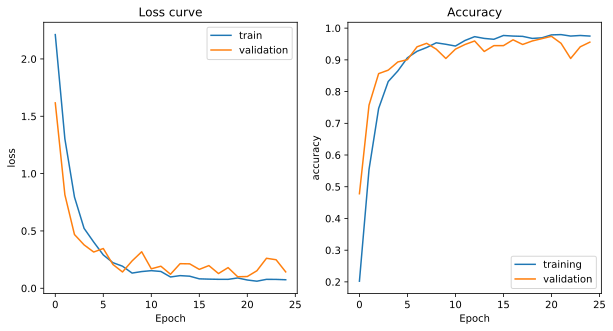

In [19]:
# let's plot the loss and accuracy 

# get the training and validation accuracy from the history object
train_acc = history1.history['acc']
valid_acc = history1.history['val_acc']

# get the loss
train_loss = history1.history['loss']
valid_loss = history1.history['val_loss']

# get the number of entries
xvalues = np.arange(len(train_acc))

# visualize
f,ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(xvalues, train_loss)
ax[0].plot(xvalues, valid_loss)
ax[0].set_title("Loss curve")
ax[0].set_xlabel("Epoch")
ax[0].set_ylabel("loss")
ax[0].legend(['train', 'validation'])

ax[1].plot(xvalues, train_acc)
ax[1].plot(xvalues, valid_acc)
ax[1].set_title("Accuracy")
ax[1].set_xlabel("Epoch")
ax[1].set_ylabel("accuracy")
ax[1].legend(['training', 'validation'])

plt.show()


In [20]:
# What is the final loss and accuracy on our validation data?
valid_loss, valid_acc = model.evaluate_generator(validation_generator, steps=validation_samples // batch_size)

print(f"Final validation accuracy: {valid_acc*100:.2f}%")

Final validation accuracy: 95.59%


In [0]:
cnn_acc=valid_acc*100


In [0]:
base_path = "/content/drive/My Drive/Thesis/"
class_names_label=labels_dict

def load_data():
    """
        Load the data:
           
    """
    
    datasets = ['training','validation']
    size = (300,300)
    output = []
    for dataset in datasets:
        directory = base_path + dataset
        images = []
        labels = []
        for folder in os.listdir(directory):
            curr_label = class_names_label[folder]
            for file in os.listdir(directory + "/" + folder):
                img_path = directory + "/" + folder + "/" + file
                curr_img = cv2.imread(img_path)
                curr_img = cv2.resize(curr_img, size)
                images.append(curr_img)
                labels.append(curr_label)
        images, labels = shuffle(images, labels)     ### Shuffle the data !!!
        images = np.array(images, dtype = 'float32') ### Our images
        labels = np.array(labels, dtype = 'int32')   ### From 0 to num_classes-1!
        
        output.append((images, labels))

    return output

In [0]:
from sklearn.utils import shuffle
(train_images, train_labels), (test_images, test_labels) = load_data()

In [0]:
train_images=train_images/255.0
test_images=test_images/255.0

In [0]:
predictions=model.predict(test_images)
pred_labels = np.argmax(predictions, axis=1)


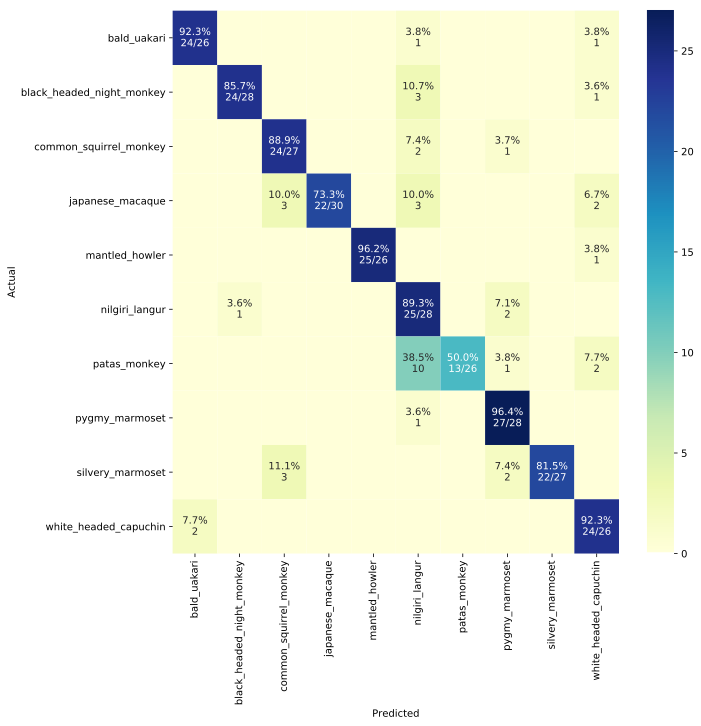

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_cm(y_true, y_pred, figsize=(10,10)):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    
    cm = pd.DataFrame(cm, index=np.unique(labels_info['Common Name']), columns=np.unique(labels_info['Common Name']))
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=ax)
   
plot_cm(test_labels, pred_labels)

In [27]:
# select all the layers for which you want to visualize the outputs and store it in a list
outputs = [layer.output for layer in model.layers[1:18]]

# Define a new model that generates the above output
vis_model = Model(model.input, outputs)

# check if we have all the layers we require for visualization 
vis_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 300, 300, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 300, 300, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 300, 300, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 150, 150, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 150, 150, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 150, 150, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 75, 75, 128)       0         
__________

In [28]:
# store the layer names we are interested in
layer_names = []
for layer in outputs:
    layer_names.append(layer.name.split("/")[0])

    
print("Layers going to be used for visualization: ")
print(layer_names)

Layers going to be used for visualization: 
['block1_conv1', 'block1_conv2', 'block1_pool', 'block2_conv1', 'block2_conv2', 'block2_pool', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_pool', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_pool', 'block5_conv1', 'block5_conv2', 'block5_conv3']


In [0]:
def get_CAM(processed_image, predicted_label):
    """
    This function is used to generate a heatmap for a sample image prediction.
    
    Args:
        processed_image: any sample image that has been pre-processed using the 
                       `preprocess_input()`method of a keras model
        predicted_label: label that has been predicted by the network for this image
    
    Returns:
        heatmap: heatmap generated over the last convolution layer output 
    """
    # we want the activations for the predicted label
    predicted_output = model.output[:, predicted_label]
    
    # choose the last conv layer in your model
    last_conv_layer = model.get_layer('block5_conv3')
    
    # get the gradients wrt to the last conv layer
    grads = K.gradients(predicted_output, last_conv_layer.output)[0]
    
    # take mean gradient per feature map
    grads = K.mean(grads, axis=(0,1,2))
    
    # Define a function that generates the values for the output and gradients
    evaluation_function = K.function([model.input], [grads, last_conv_layer.output[0]])
    
    # get the values
    grads_values, conv_ouput_values = evaluation_function([processed_image])
    
    # iterate over each feature map in yout conv output and multiply
    # the gradient values with the conv output values. This gives an 
    # indication of "how important a feature is"
    for i in range(512): # we have 512 features in our last conv layer
        conv_ouput_values[:,:,i] *= grads_values[i]
    
    # create a heatmap
    heatmap = np.mean(conv_ouput_values, axis=-1)
    
    # remove negative values
    heatmap = np.maximum(heatmap, 0)
    
    # normalize
    heatmap /= heatmap.max()
    
    return heatmap

In [0]:
def show_random_sample(idx):
    """
    This function is used to select a random sample from the validation dataframe.
    It generates prediction for the same. It also stores the heatmap and the intermediate
    layers activation maps.
    
    Arguments:
        idx: random index to select a sample from validation data
    
    Returns:
        activations: activation values for intermediate layers
    """
    # select the sample and read the corresponding image and label
    sample_image = cv2.imread(valid_df.iloc[idx]['image'])
    sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)
    sample_image = cv2.resize(sample_image, (img_rows, img_cols))
    sample_label = valid_df.iloc[idx]["label"]
    
    # pre-process the image
    sample_image_processed = np.expand_dims(sample_image, axis=0)
    sample_image_processed = preprocess_input(sample_image_processed)
    
    # generate activation maps from the intermediate layers using the visualization model
    activations = vis_model.predict(sample_image_processed)
    
    # get the label predicted by our original model
    pred_label = np.argmax(model.predict(sample_image_processed), axis=-1)[0]
    
    # choose any random activation map from the activation maps 
    sample_activation = activations[0][0,:,:,32]
    
    # normalize the sample activation map
    sample_activation-=sample_activation.mean()
    sample_activation/=sample_activation.std()
    
    # convert pixel values between 0-255
    sample_activation *=255
    sample_activation = np.clip(sample_activation, 0, 255).astype(np.uint8)
    
    
    
    # get the heatmap for class activation map(CAM)
    heatmap = get_CAM(sample_image_processed, pred_label)
    heatmap = cv2.resize(heatmap, (sample_image.shape[0], sample_image.shape[1]))
    heatmap = heatmap *255
    heatmap = np.clip(heatmap, 0, 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    super_imposed_image = heatmap + sample_image
    super_imposed_image = np.clip(super_imposed_image, 0,255).astype(np.uint8)

    f,ax = plt.subplots(1,3, figsize=(8,4))
    ax[0].imshow(sample_image)
    ax[0].set_title(f"True label: {sample_label} \n Predicted label: {pred_label}")
    ax[0].axis('off')
    
    ax[1].imshow(sample_activation)
    ax[1].set_title("Random feature map ")
    ax[1].axis('off')
    
    ax[2].imshow(super_imposed_image)
    ax[2].set_title("Activation map superimposed")
    ax[2].axis('off')
    plt.show()
    
    return activations

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


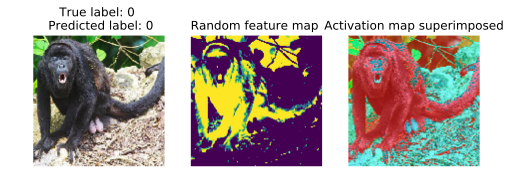

In [31]:
# Get the intermediate activations and plot the heatmap first
activations= show_random_sample(19)

In [0]:
def visualize_intermediate_activations(layer_names, activations):
    """
    This function is used to visualize all the itermediate activation maps
    
    Arguments:
        layer_names: list of names of all the intermediate layers we chose
        activations: all the intermediate activation maps 
    """
    assert len(layer_names)==len(activations), "Make sure layers and activation values match"
    images_per_row=16
    
    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size= layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size*nb_cols, size*images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0,:,:,col*images_per_row + row]
                feature_map -= feature_map.mean()
                feature_map /= feature_map.std()
                feature_map *=255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col*size:(col+1)*size, row*size:(row+1)*size] = feature_map

        scale = 1./size
        plt.figure(figsize=(scale*grid.shape[1], scale*grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(grid, aspect='auto', cmap='viridis')
    plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


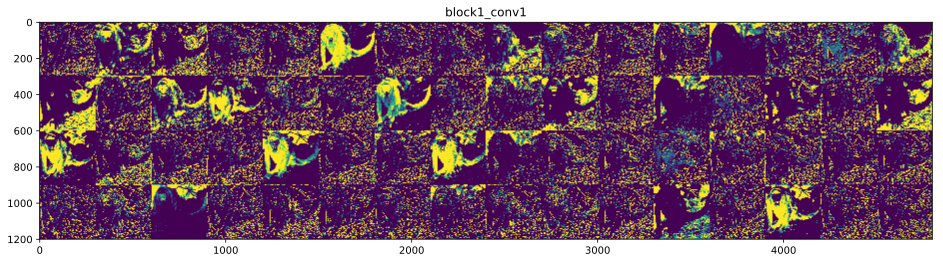

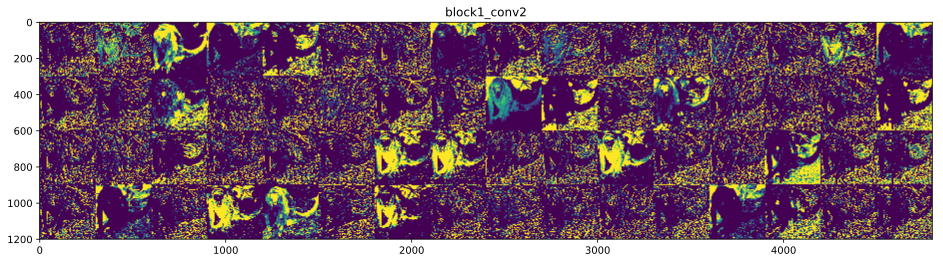

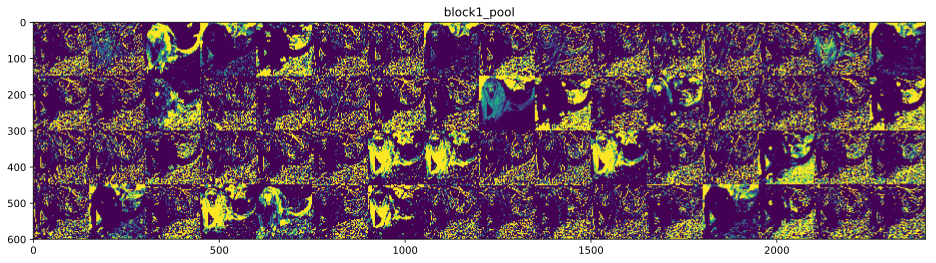

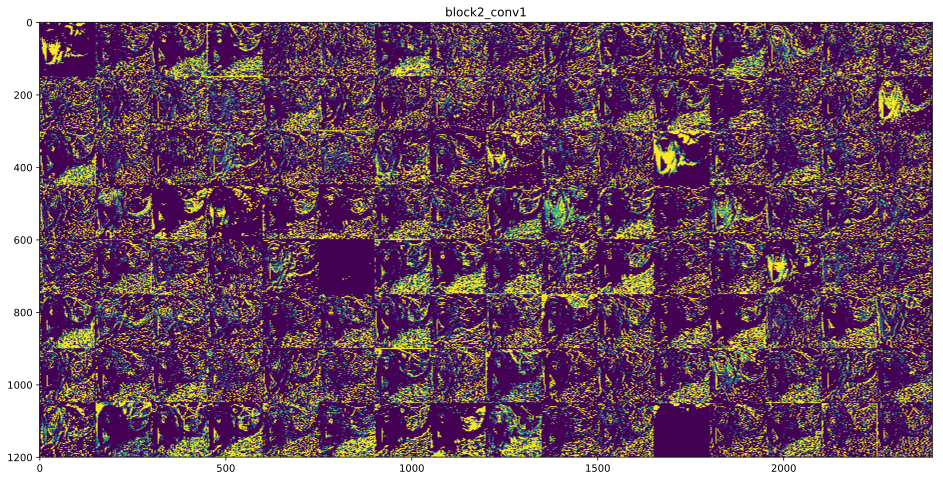

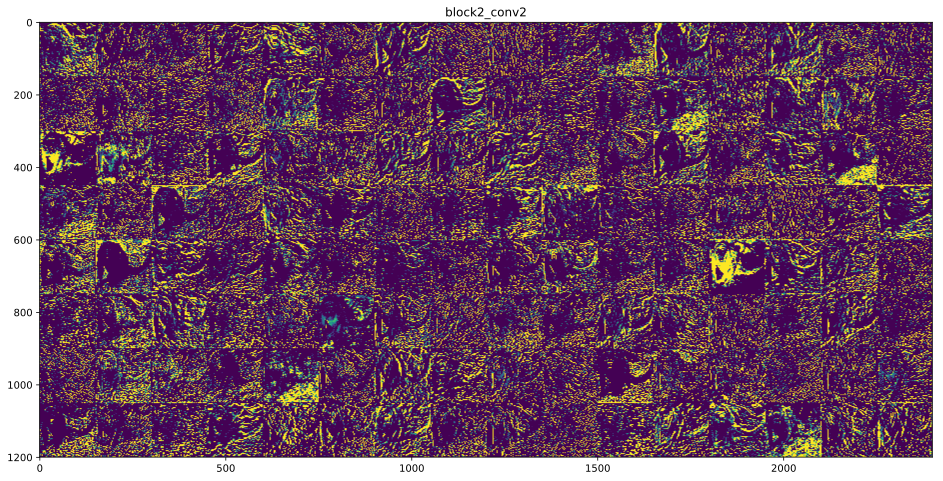

...

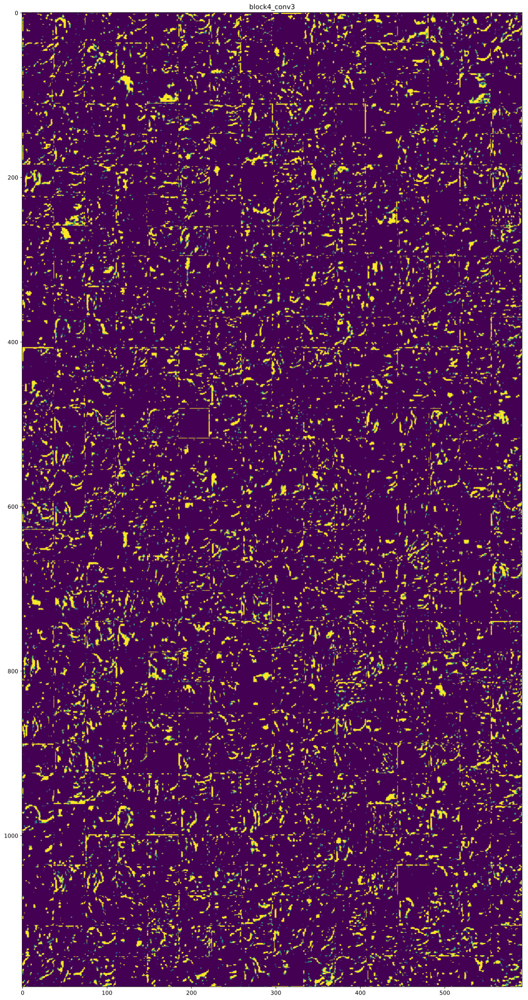

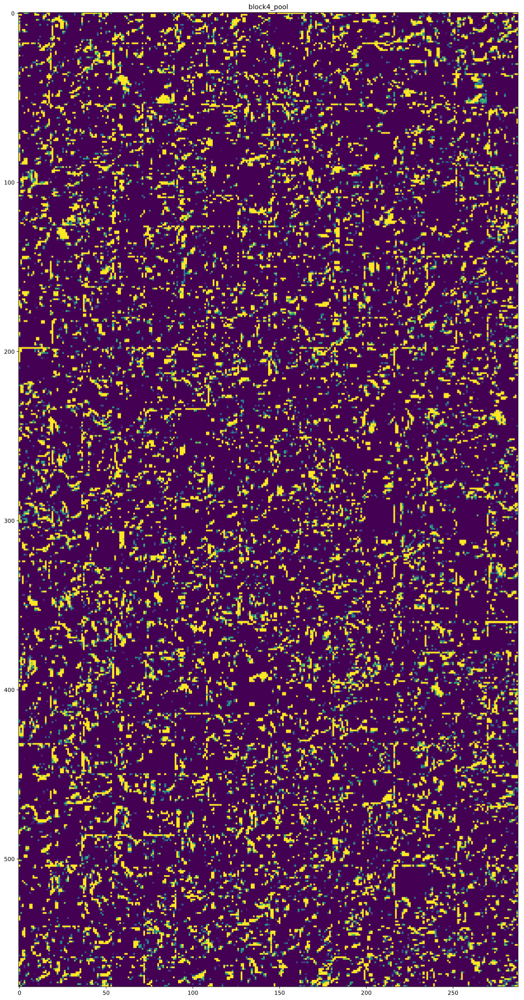

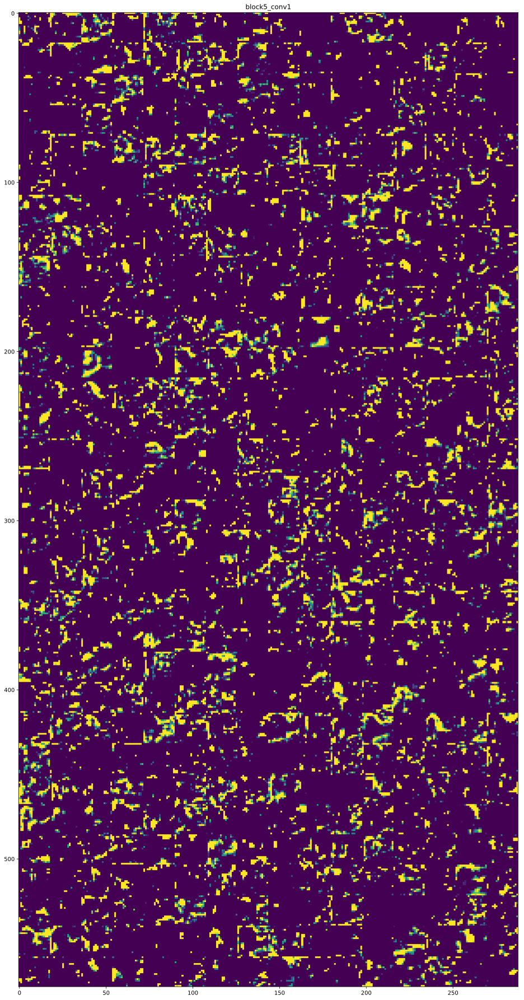

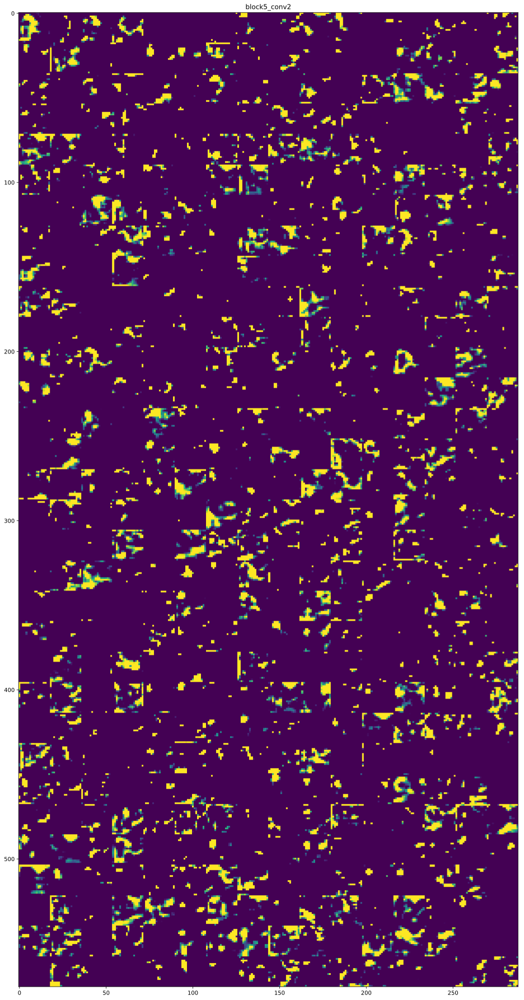

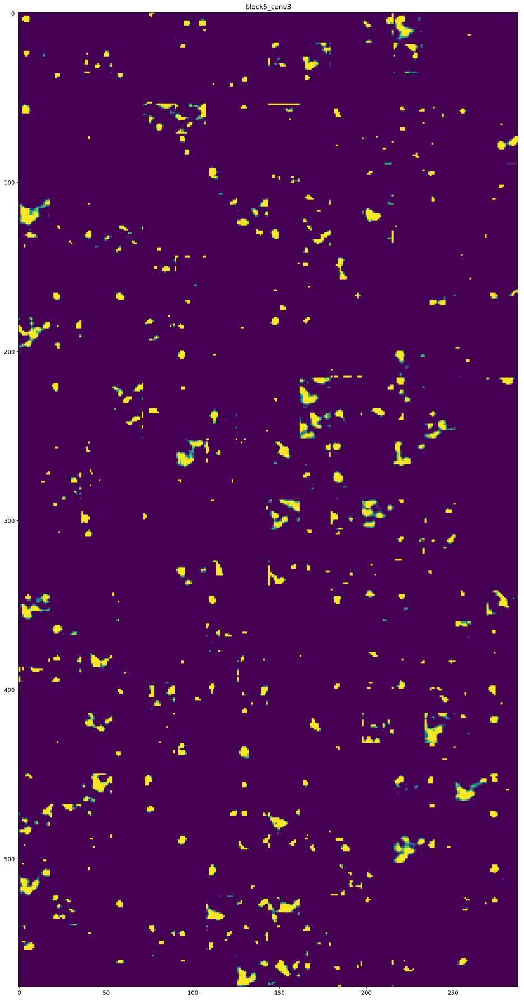

In [33]:
# visualize all the activation maps for this sample
visualize_intermediate_activations(activations=activations, layer_names=layer_names)

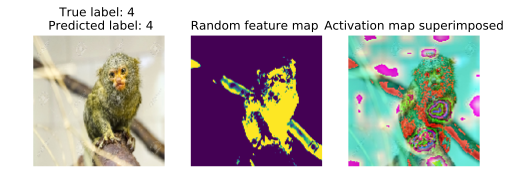

In [38]:
sample_idx=21
activations= show_random_sample(sample_idx)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


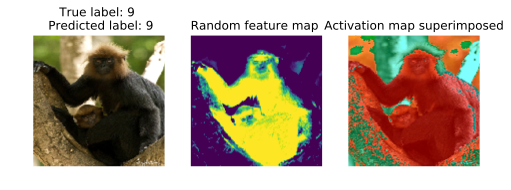

In [35]:
sample_idx=11
activations= show_random_sample(sample_idx)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


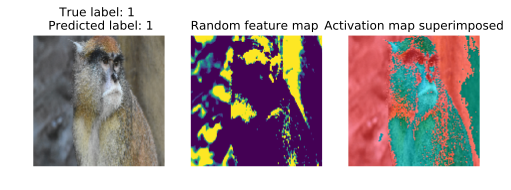

In [41]:
sample_idx=139
activations= show_random_sample(sample_idx)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in true_divide


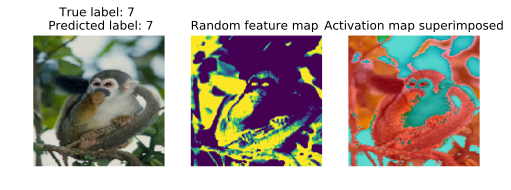

In [35]:
sample_idx=228
activations= show_random_sample(sample_idx)

# Machine Learning Algorithms

In [0]:
import numpy as np
import cv2
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import glob
import os
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm
from sklearn.cluster import KMeans

from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from pathlib import Path

In [0]:
train_images = []
labels = [] 
for train_dir_path in glob.glob("/content/drive/My Drive/Thesis/training/*"):
    train_label = train_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(train_dir_path, "*.jpg")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        image = cv2.resize(image, (45, 45))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        train_images.append(image)
        labels.append(train_label)
train_images = np.array(train_images)
labels = np.array(labels)

In [0]:
label_to_id_dict = {v:i for i,v in enumerate(np.unique(labels))}
id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}

In [46]:
id_to_label_dict

{0: 'n0',
 1: 'n1',
 2: 'n2',
 3: 'n3',
 4: 'n4',
 5: 'n5',
 6: 'n6',
 7: 'n7',
 8: 'n8',
 9: 'n9'}

In [0]:
label_ids = np.array([label_to_id_dict[x] for x in labels])

In [48]:
label_ids

array([3, 3, 3, ..., 9, 9, 9])

In [0]:
scaler = StandardScaler()
images_scaled = scaler.fit_transform([i.flatten() for i in train_images])

In [0]:
pca = PCA(n_components=60)
pca_result = pca.fit_transform(images_scaled)

In [0]:
tsne = TSNE(n_components=3, perplexity=40.0)
tsne_result = tsne.fit_transform(pca_result)
tsne_result_scaled = StandardScaler().fit_transform(tsne_result)

In [0]:
X_train, X_test, y_train, y_test = train_test_split(pca_result, label_ids, test_size=0.3, random_state=42)

# Random Forest

In [0]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(n_estimators=150)
forest = forest.fit(X_train, y_train)

In [0]:
test_predictions = forest.predict(X_test)

In [55]:
rf_acc = accuracy_score(test_predictions, y_test) * 100
print("Accuracy with RandomForest: {0:.6f}".format(rf_acc))

Accuracy with RandomForest: 44.680851


# SVM

In [56]:
from sklearn import svm
svm_clf = svm.SVC()
svm_clf = svm_clf.fit(X_train, y_train) 

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [0]:
test_predictions = svm_clf.predict(X_test)

In [58]:
svm_acc = accuracy_score(test_predictions, y_test) * 100
print("Accuracy with SVM: {0:.6f}".format(svm_acc))

Accuracy with SVM: 24.012158


# Validation 

In [0]:
valid_images = []
valid_labels = [] 
for valid_dir_path in glob.glob("/content/drive/My Drive/Thesis/validation/*"):
    valid_label = valid_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(valid_dir_path, "*.jpg")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        image = cv2.resize(image, (45, 45))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        valid_images.append(image)
        valid_labels.append(valid_label)
valid_images = np.array(valid_images)
valid_labels = np.array(valid_labels)

In [60]:
valid_label_ids = np.array([label_to_id_dict[x] for x in valid_labels])
valid_label_ids

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6])

In [0]:
scaler = StandardScaler()
validation_images_scaled = scaler.fit_transform([i.flatten() for i in valid_images])
validation_pca_result = pca.transform(validation_images_scaled)

# Validation with Random Forest

In [62]:
test_predictions = forest.predict(validation_pca_result)
precision = accuracy_score(test_predictions, valid_label_ids) * 100
print("Validation Accuracy with Random Forest: {0:.6f}".format(precision))

Validation Accuracy with Random Forest: 51.470588


# Validation with SVM

In [63]:
test_predictions = svm_clf.predict(validation_pca_result)
precision = accuracy_score(test_predictions, valid_label_ids) * 100
print("Validation Accuracy with SVM: {0:.6f}".format(precision))

Validation Accuracy with SVM: 25.000000


# KNN

Knn with k=5

In [0]:
#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier

#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=5)

#Train the model using the training sets
knn.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = knn.predict(X_test)

# Model Evaluation for k=5

In [65]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
k5_acc=metrics.accuracy_score(y_test, y_pred)*100
print("Accuracy:",k5_acc)

Accuracy: 29.17933130699088


KNN with k=7

In [0]:
#Import knearest neighbors Classifier model
from sklearn.neighbors import KNeighborsClassifier
#Create KNN Classifier
knn = KNeighborsClassifier(n_neighbors=7)
#Train the model using the training sets
knn.fit(X_train, y_train)
#Predict the response for test dataset
y_pred = knn.predict(X_test)

# Model Evaluation for k=7

In [67]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
k7_acc=metrics.accuracy_score(y_test, y_pred)*100
print("Accuracy:",k7_acc)
print(metrics.classification_report(y_test, y_pred))


Accuracy: 31.00303951367781
              precision    recall  f1-score   support

           0       0.39      0.41      0.40        32
           1       0.24      0.69      0.36        35
           2       0.40      0.28      0.33        36
           3       0.41      0.51      0.46        41
           4       0.21      0.23      0.22        30
           5       0.67      0.06      0.11        32
           6       0.47      0.30      0.37        23
           7       0.32      0.15      0.20        41
           8       0.20      0.18      0.19        34
           9       0.30      0.24      0.27        25

    accuracy                           0.31       329
   macro avg       0.36      0.30      0.29       329
weighted avg       0.36      0.31      0.29       329



# for K= 1 to 25

In [68]:
# try K=1 through K=25 and record testing accuracy
k_range = range(1, 25)

# We can create Python dictionary using [] or dict()
scores = []

# We use a loop through the range 1 to 25
# We append the scores in the dictionary
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    scores.append(metrics.accuracy_score(y_test, y_pred))
knn_acc=scores*100
print(scores)

[0.4194528875379939, 0.3738601823708207, 0.3434650455927052, 0.2887537993920973, 0.2917933130699088, 0.303951367781155, 0.3100303951367781, 0.3100303951367781, 0.3069908814589666, 0.3221884498480243, 0.303951367781155, 0.3069908814589666, 0.3404255319148936, 0.3252279635258359, 0.3130699088145897, 0.3404255319148936, 0.3343465045592705, 0.3252279635258359, 0.3252279635258359, 0.3161094224924012, 0.3282674772036474, 0.3343465045592705, 0.3282674772036474, 0.3465045592705167]


Text(0, 0.5, 'Testing Accuracy')

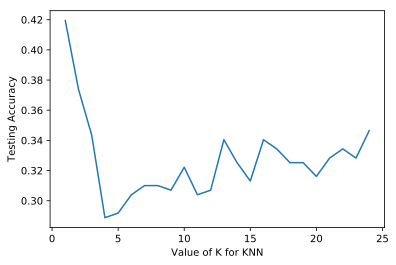

In [69]:
# import Matplotlib (scientific plotting library)
import matplotlib.pyplot as plt

# allow plots to appear within the notebook
%matplotlib inline

# plot the relationship between K and testing accuracy
# plt.plot(x_axis, y_axis)
plt.plot(k_range, scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Testing Accuracy')

# Decision Tree

In [0]:
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier().fit(X_train, y_train)

In [0]:
y_pred = tree.predict(X_test)

In [72]:
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
dt_acc=metrics.accuracy_score(y_test, y_pred)*100
print("Accuracy:",dt_acc)
print(metrics.classification_report(y_test, y_pred))

Accuracy: 33.43465045592705
              precision    recall  f1-score   support

           0       0.52      0.47      0.49        32
           1       0.39      0.34      0.36        35
           2       0.34      0.31      0.32        36
           3       0.33      0.29      0.31        41
           4       0.28      0.50      0.36        30
           5       0.19      0.19      0.19        32
           6       0.28      0.39      0.33        23
           7       0.42      0.37      0.39        41
           8       0.28      0.21      0.24        34
           9       0.33      0.32      0.33        25

    accuracy                           0.33       329
   macro avg       0.34      0.34      0.33       329
weighted avg       0.34      0.33      0.33       329



# Navie Bayes Classifier

In [0]:
#Import Gaussian Naive Bayes model
from sklearn.naive_bayes import GaussianNB
#Create a Gaussian Classifier
model = GaussianNB()
# Train the model using the training sets
model.fit(X_train,y_train)
y_pred =model.predict(X_test)

In [74]:
print(metrics.classification_report(y_test, y_pred))
#print(metrics.confusion_matrix(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.32      0.38      0.35        32
           1       0.36      0.51      0.42        35
           2       0.79      0.42      0.55        36
           3       0.45      0.49      0.47        41
           4       0.25      0.37      0.30        30
           5       0.33      0.38      0.35        32
           6       0.62      0.57      0.59        23
           7       0.43      0.32      0.37        41
           8       0.22      0.15      0.18        34
           9       0.28      0.28      0.28        25

    accuracy                           0.38       329
   macro avg       0.41      0.38      0.39       329
weighted avg       0.41      0.38      0.39       329



In [75]:
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
nb_acc=metrics.accuracy_score(y_test, y_pred)*100
print("Accuracy:",nb_acc)

Accuracy: 38.297872340425535


# LinearSVM

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import cv2
from pathlib import Path
from tqdm import tqdm
import random as rn
from random import shuffle  
from zipfile import ZipFile
from PIL import Image

from skimage import feature, color, data
from sklearn.preprocessing import LabelEncoder

In [0]:
# The training data set is in the /Users/macos/Documents/Intel Image Classification/seg_train
trn_img_path = "/content/drive/My Drive/Thesis/training/"

# The testing data set is in the /Users/macos/Documents/Intel Image Classification/seg_test
tst_img_path = "/content/drive/My Drive/Thesis/validation/"

# Lets create 2 set of arrays for train & testing data's. One for to store the Image data and anther one for label details
X_train =[] # Stores the training image hog data
label_train = [] # Stores the training image label

X_test = [] # Stores the testing image hog data
label_test = [] # Stores the testing image label


In [0]:
labels_path = Path('/content/drive/My Drive/Thesis/monkey_labels.txt')
labels_info = []

# Read the file
lines = labels_path.read_text().strip().splitlines()[1:]
for line in lines:
    line = line.split(',')
    line = [x.strip(' \n\t\r') for x in line]
    line[3], line[4] = int(line[3]), int(line[4])
    line = tuple(line)
    labels_info.append(line)
    
# Convert the data into a pandas dataframe
labels_info = pd.DataFrame(labels_info, columns=['Label', 'Latin Name', 'Common Name', 
                                                 'Train Images', 'Validation Images'], index=None)
labels=labels_info['Label']
label_names=labels_info['Common Name']

In [0]:
def hog_data_extractor(jpeg_path):
    jpeg_data = cv2.imread(jpeg_path)
    jpeg_data=cv2.resize(jpeg_data,(150,150)) 
    hog_data = feature.hog(jpeg_data)/255.0
    return hog_data

In [0]:
def jpeg_to_array (labels, img_root_path,data_type):
    label_path = os.path.join(img_root_path,labels.lower())
    print('Loading ' + data_type +' images for scene type '+labels)
    for img in os.listdir(label_path):
        img_path = os.path.join(label_path,img)
        if img_path.endswith('.jpg'):
            if(data_type == 'Training'):
                X_train.append(hog_data_extractor(img_path))
                label_train.append(str(labels))
            if(data_type =='Testing'):
                X_test.append(hog_data_extractor(img_path))
                label_test.append(np.array(str(labels)))

In [81]:
[jpeg_to_array(label,trn_img_path,'Training')for label in labels]
len(X_train)
[jpeg_to_array(label,tst_img_path,'Testing')for label in labels]
len(X_test)

Loading Training images for scene type n0
Loading Training images for scene type n1
Loading Training images for scene type n2
Loading Training images for scene type n3
Loading Training images for scene type n4
Loading Training images for scene type n5
Loading Training images for scene type n6
Loading Training images for scene type n7
Loading Training images for scene type n8
Loading Training images for scene type n9
Loading Testing images for scene type n0
Loading Testing images for scene type n1
Loading Testing images for scene type n2
Loading Testing images for scene type n3
Loading Testing images for scene type n4
Loading Testing images for scene type n5
Loading Testing images for scene type n6
Loading Testing images for scene type n7
Loading Testing images for scene type n8
Loading Testing images for scene type n9


272

In [0]:
le = LabelEncoder()
y_train = le.fit_transform(label_train)
y_test = le.fit_transform(label_test)


Creating a Linear SVM model and train it

In [0]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.svm import LinearSVC

In [84]:
lsvc = LinearSVC(random_state=0,tol=1e-5)
lsvc.fit(X_train,y_train)
print('Coef',lsvc.coef_)
print('Intercept',lsvc.intercept_)

Coef [[ 0.01416729  0.00587147  0.00492102 ...  0.03872079  0.02003975
   0.01860332]
 [ 0.00447656 -0.00081856 -0.01385459 ...  0.01978133  0.00971887
   0.0233614 ]
 [-0.01072557  0.00608419  0.03123779 ... -0.00806631  0.00438236
   0.01091584]
 ...
 [ 0.00667781  0.00655845  0.00213697 ...  0.01064383  0.0201272
   0.00672061]
 [-0.00282725 -0.00691397 -0.01142698 ... -0.03080026 -0.02869016
  -0.02382266]
 [ 0.00656038  0.00204371  0.00822511 ...  0.02840307  0.00650967
   0.02035304]]
Intercept [-0.78554788 -0.84742858 -0.80434978 -0.80296037 -0.80435409 -0.75419675
 -0.76488473 -0.77672315 -0.80955599 -0.82706011]


In [0]:
y_pred = lsvc.predict(X_test)

In [86]:
# filter all the warnings
import warnings
warnings.filterwarnings('ignore')

# 10-fold cross validation
lsvc_score = lsvc.score(X_test,y_test)
print('Score', lsvc_score)
kfold = KFold(n_splits=10, random_state=9)
cv_results = cross_val_score(lsvc , X_train, y_train, cv=kfold, scoring="accuracy")
print(cv_results)

Score 0.14705882352941177
[0.         0.         0.03636364 0.         0.05454545 0.
 0.         0.         0.         0.        ]


In [87]:
print(cv_results.mean(), cv_results.std())

0.00909090909090909 0.018630819574471998


In [88]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
lsvm_acc=metrics.accuracy_score(y_test, y_pred)*100
print("Accuracy:",lsvm_acc)

Accuracy: 14.705882352941178


In [0]:
def image_predict(img_path):
    image = cv2.imread(img_path)
    ip_image = Image.open(img_path)
    image = cv2.resize(image,(150,150))
    prd_image_data = hog_data_extractor(img_path)
    scene_predicted = lsvc.predict(prd_image_data.reshape(1, -1))[0]
    fig, ax = plt.subplots(1, 2, figsize=(12, 6),
                       subplot_kw=dict(xticks=[], yticks=[]))
    ax[0].imshow(ip_image)
    ax[0].set_title('input image')

    ax[1].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax[1].set_title('Monkey predicted :'+ labels[scene_predicted]);

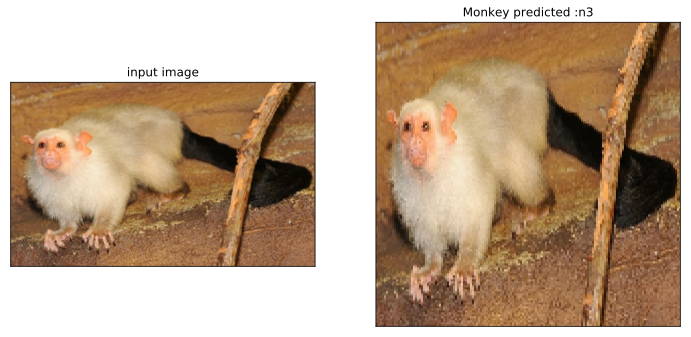

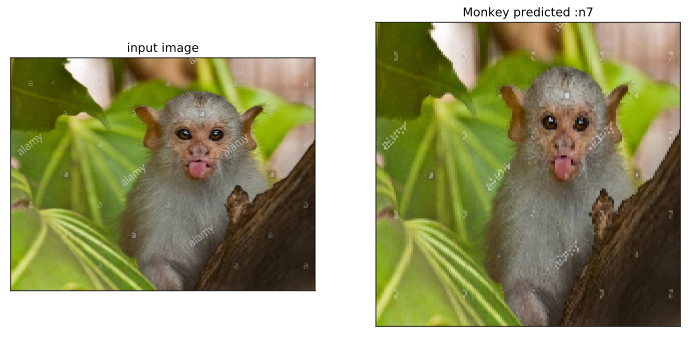

In [90]:
ip_img_folder = '/content/drive/My Drive/Thesis/validation/n6/'
ip_img_files = ['n609.jpg','n619.jpg']
scene_predicted = [image_predict(os.path.join(ip_img_folder,img_file))for img_file in ip_img_files]

Text(0.5, 1.0, 'MODEL ACCURACY SCORE')

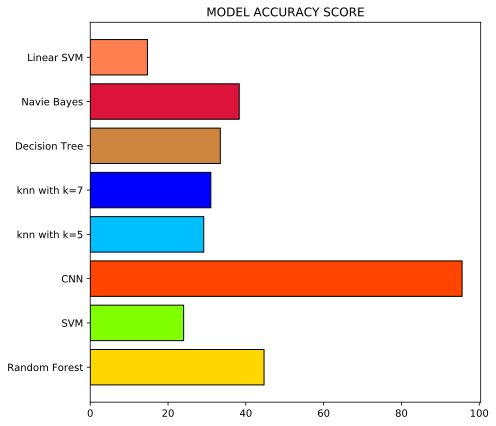

In [103]:
i=['Random Forest','SVM','CNN','knn with k=5', 'knn with k=7','Decision Tree','Navie Bayes','Linear SVM']
j=[rf_acc, svm_acc, cnn_acc,k5_acc, k7_acc,dt_acc,nb_acc,lsvm_acc]
model_accuracy = pd.DataFrame()
model_accuracy['index']=i
model_accuracy['acc']=j
fig= plt.figure(figsize=(7,7))
#model_accuracy.sort_values(ascending= False).plot.barh()
plt.barh(model_accuracy['index'],model_accuracy['acc'],color=['gold', 'chartreuse', 'orangered','deepskyblue', 'blue', 'peru','crimson','coral'], edgecolor='black')

plt.title('MODEL ACCURACY SCORE')